<a href="https://colab.research.google.com/github/mahoangnhatphi/AIN501C/blob/main/1_breeds_of_dog_classifications.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Breeds of Dog classification
### PhiMHN (Ma Hoang Nhat Phi)
### ID student: 22MSE23090
![]()
<img src="https://github.com/mahoangnhatphi/AIN501C/blob/main/img/title.jpg?raw=true" width="200">


> Problem: The objective of this project is to develop a deep learning model that can accurately detect and classify dog breeds from a dataset consisting of 66 different breeds, with each breed having 30 images. The primary goal is to create a reliable algorithm capable of classifying these breeds correctly. The model architecture will include multiple layers, incorporating the Inception_V3 architecture, to improve the accuracy and robustness of the breed classification.

> Key Objectives:
> 1. Develop a deep learning model for dog breed classification.
> 2. Utilize a dataset comprising 66 unique dog breeds, with 30 images per breed.
> 3. Implement the Inception_V3 architecture as a crucial component of the model.
> 4. Achieve high accuracy in breed classification.
> 5. Enable the model to correctly identify and label dog breeds in previously unseen images.

Dataset description:
- root
    - train: folder includes train data pictures of each dog breed, name of each picture is uuid
    - test: folder includes test data pictures of each dog breed, name of each picture is uuid
    - labels.csv: label file which has structure
          | id | breed |
      - id is uuid of picture filename in folders
      - breed is breed of dog

Crawler tool: https://github.com/mahoangnhatphi/AIN501C/tree/main/crawler-tool

# 1. Import data


In [2]:
# Install kaggle
!pip install kaggle

In [3]:
# Clean up working dir
!rm -rf ./input

In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import os
# Cấu hình secret key để xác thực truy cập đến Kaggle trên môi trường
os.environ['KAGGLE_USERNAME'] = 'phimhongnht'
os.environ['KAGGLE_KEY'] = '9a66e2c809122b723bbd83a30e78c0ca'
if not os.path.exists('./input'):
  !kaggle datasets download -d phimhongnht/dog-breeds-data -p ./
  !unzip  ./*.zip -d ./input
else:
    print('File already exists, no need to download or unzip.')

print(os.listdir('./input'))

 88% 128M/146M [00:02<00:00, 49.2MB/s]
100% 146M/146M [00:02<00:00, 57.6MB/s]
Archive:  ./dog-breeds-data.zip
  inflating: ./input/labels.csv      
  inflating: ./input/test/0012ab67-26e3-4e73-9a37-824f9e2d0b2f.jpg  
  inflating: ./input/test/009abc30-a314-4b3f-a852-c7bd061427b8.jpg  
  inflating: ./input/test/00a93700-e9df-49a5-ab6e-ab22f180fb96.jpg  
  inflating: ./input/test/00dd1b43-24a4-4480-a548-a85c1f6c0a34.jpg  
  inflating: ./input/test/00eecff0-8883-41e5-ae0a-3f121f7b2ba2.jpg  
  inflating: ./input/test/0109f58f-370c-4f44-8cc0-80ec845a98ae.jpg  
  inflating: ./input/test/010f58c7-de80-47bb-8b9c-a72f031810f0.jpg  
  inflating: ./input/test/012ff82c-9cae-4136-9116-245975e9fa5d.jpg  
  inflating: ./input/test/0168535e-7fd7-411a-ada1-a4f253e29f62.jpg  
  inflating: ./input/test/0179e75c-b135-4b47-881d-8d09a2733de3.jpg  
  inflating: ./input/test/01bca992-cb3d-4032-95a6-41e48011aa7f.jpg  
  inflating: ./input/test/01e8a1f8-0530-458a-a064-914b713adef6.jpg  
  inflating: ./input/tes

In [43]:
# Import library
# System
import sys
import os
import argparse

# Time
import time
import datetime

# Numerical Data
import random
import numpy as np
import pandas as pd

# Tools
import shutil
from glob import glob
from tqdm import tqdm
import gc

# NLP
import re

# Preprocessing
from sklearn import preprocessing
from sklearn.utils import class_weight as cw
from sklearn.utils import shuffle

# Model Selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Machine Learning Models
from sklearn import svm
from sklearn.svm import LinearSVC, SVC

# Evaluation Metrics
from sklearn import metrics
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, confusion_matrix, classification_report, roc_auc_score


# Deep Learning - Keras -  Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# Deep Learning - Keras - Model
import keras
from keras import models
from keras.models import Model
from keras.models import Sequential

# Deep Learning - Keras - Layers
from keras.layers import Convolution1D, concatenate, SpatialDropout1D, GlobalMaxPool1D, GlobalAvgPool1D, Embedding, \
    Conv2D, SeparableConv1D, Add, BatchNormalization, Activation, GlobalAveragePooling2D, LeakyReLU, Flatten
from keras.layers import Dense, Input, Dropout, MaxPool2D, MaxPooling2D, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, \
    Lambda, Multiply, LSTM, Bidirectional, PReLU, MaxPooling1D
# from keras.layers.pooling import _GlobalPooling1D
from tensorflow.keras.layers import Conv2D, MaxPooling2D

from keras.regularizers import l2

# Deep Learning - Keras - Pretrained Models
from keras.applications.xception import Xception
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.densenet import DenseNet201
from keras.applications.nasnet import NASNetMobile, NASNetLarge

from keras.applications.nasnet import preprocess_input

# Deep Learning - Keras - Model Parameters and Evaluation Metrics
from keras import optimizers
from keras.optimizers import Adam, SGD , RMSprop
from keras.losses import mae, sparse_categorical_crossentropy, binary_crossentropy

# Deep Learning - Keras - Visualisation
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau, LearningRateScheduler
# from keras.wrappers.scikit_learn import KerasClassifier
from keras import backend as K

# Deep Learning - TensorFlow
import tensorflow as tf

# Graph/ Visualization
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import seaborn as sns
from mlxtend.plotting import plot_confusion_matrix

# Image
import cv2
from PIL import Image
from IPython.display import display

# Support utils
def date_time(x):
    if x==1:
        return 'Timestamp: {:%Y-%m-%d %H:%M:%S}'.format(datetime.datetime.now())
    if x==2:
        return 'Timestamp: {:%Y-%b-%d %H:%M:%S}'.format(datetime.datetime.now())
    if x==3:
        return 'Date now: %s' % datetime.datetime.now()
    if x==4:
        return 'Date today: %s' % datetime.date.today()

# np.random.seed(42)

%matplotlib inline

# Input data
print(os.listdir("/content/input"))

['train', 'test', 'test_labels.csv', 'labels.csv']


## 1.1. Configure

In [7]:
input_directory = r"/content/input/"
output_directory = r"/content/output/"

training_dir = input_directory + "train"
testing_dir = input_directory + "test"

if not os.path.exists(output_directory):
    os.mkdir(output_directory)

figure_directory = "./output/figures"
if not os.path.exists(figure_directory):
    os.mkdir(figure_directory)

file_name_pred_batch = figure_directory+r"/result"
file_name_pred_sample = figure_directory+r"/sample"

In [8]:
train_df = pd.read_csv(input_directory + "/labels.csv")
train_df.rename(columns={"breed": "label"}, inplace=True)
train_df["id"] = train_df["id"].apply(lambda x: x+"."+"jpg")
train_df.head()

,id,label
0,f99b052c-12ce-4b08-8b49-e54f07140132.jpg,newfoundland
1,5efa210d-7474-4c6e-b845-123a0b12830c.jpg,appenzeller
2,be6a0e2b-fb1b-45b6-91c8-058a874534c1.jpg,dalmatian
3,7daa84c7-3561-4aca-87ef-e35678b3a45c.jpg,komondor
4,b0ed10f7-46a0-4023-ba72-20614d677a99.jpg,appenzeller


In [9]:
classes = list(train_df["label"].unique())
classes.sort()
classes

['affenpinscher',
 'african',
 'airedale',
 'akita',
 'appenzeller',
 'basenji',
 'beagle',
 'bluetick',
 'borzoi',
 'bouvier',
 'boxer',
 'brabancon',
 'briard',
 'chihuahua',
 'chow',
 'clumber',
 'cockapoo',
 'coonhound',
 'cotondetulear',
 'dachshund',
 'dalmatian',
 'dhole',
 'dingo',
 'doberman',
 'entlebucher',
 'eskimo',
 'germanshepherd',
 'groenendael',
 'havanese',
 'husky',
 'keeshond',
 'kelpie',
 'komondor',
 'kuvasz',
 'labradoodle',
 'labrador',
 'leonberg',
 'lhasa',
 'malamute',
 'malinois',
 'maltese',
 'mexicanhairless',
 'mix',
 'newfoundland',
 'otterhound',
 'papillon',
 'pekinese',
 'pembroke',
 'pitbull',
 'pomeranian',
 'pug',
 'puggle',
 'pyrenees',
 'redbone',
 'rottweiler',
 'saluki',
 'samoyed',
 'schipperke',
 'sharpei',
 'shiba',
 'shihtzu',
 'stbernard',
 'tervuren',
 'vizsla',
 'weimaraner',
 'whippet']

In [10]:
print('Num of breeds: ', len(classes))

Num of breeds:  66


In [11]:
test_files = os.listdir(testing_dir)

test_df = pd.DataFrame({"id": test_files, "label": "boston_bull"})

test_df.head()

,id,label
0,ef5cc175-c808-4308-8d43-5b97b70dc179.jpg,boston_bull
1,6d22beb2-646c-4903-9835-3f6d1f107304.jpg,boston_bull
2,eedb722c-b414-41cf-93b8-517c4ebb8c46.jpg,boston_bull
3,d266a620-ecbb-4c22-b6c3-76a84e3e3ffe.jpg,boston_bull
4,fa2b24f9-ef13-460a-b099-c19810b91ee4.jpg,boston_bull


In [12]:
len(train_df), len(test_df)

(1729, 1733)

## 1.2. Output Configuration

In [13]:
# %mkdir -p ./output
# %mkdir -p ./output/models/
# %mkdir -p ./output/logs/
main_model_dir = output_directory + r"models/"
main_log_dir = output_directory + r"logs/"

try:
    os.mkdir(main_model_dir)
except:
    print("Could not create main model directory")

try:
    os.mkdir(main_log_dir)
except:
    print("Could not create main log directory")



model_dir = main_model_dir + time.strftime('%Y-%m-%d %H-%M-%S') + "/"
log_dir = main_log_dir + time.strftime('%Y-%m-%d %H-%M-%S')


try:
    os.mkdir(model_dir)
except:
    print("Could not create model directory")

try:
    os.mkdir(log_dir)
except:
    print("Could not create log directory")

model_file = model_dir + "{epoch:02d}-val_accuracy-{val_accuracy:.2f}-val_loss-{val_loss:.2f}.hdf5"

# 2. Visualization

## 2.1 Show image samples of all classes/ selected number of classes

Showing 5 classes...
1. Cockapoo


<ipython-input-44-675f3b3f83ba>:93: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for id, file in label_map[label].iteritems():


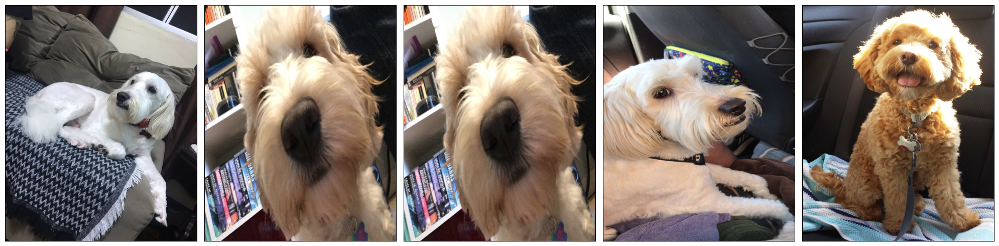

2. Komondor


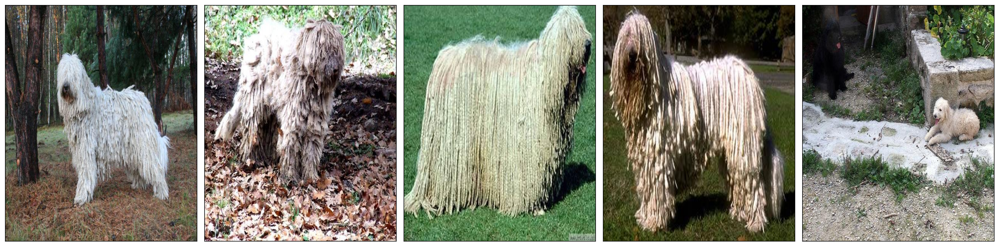

3. Labrador


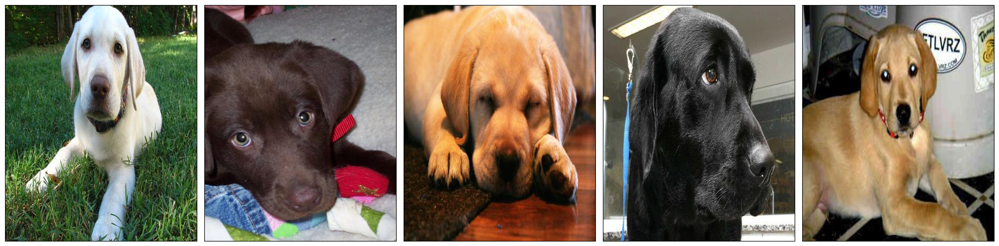

4. Beagle


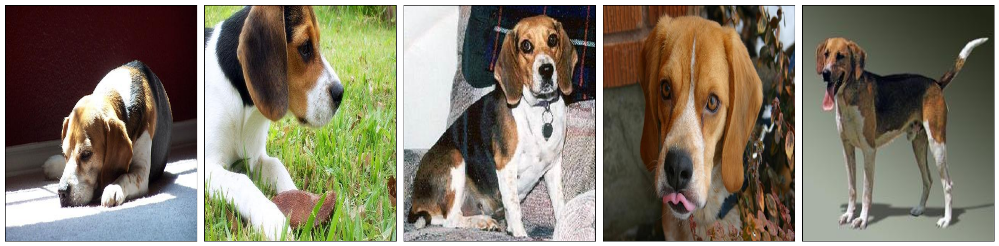

5. Bluetick


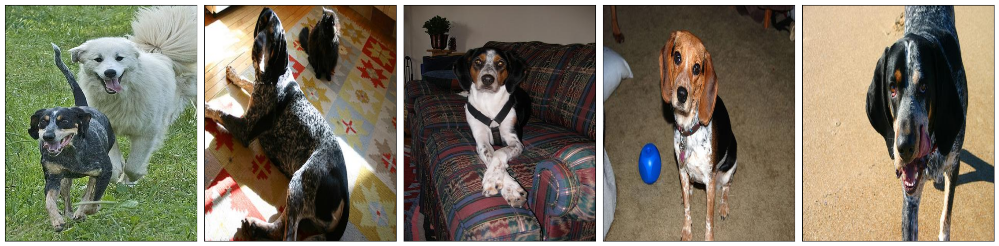

In [44]:
def plot_image(file, directory=None, sub=False, aspect=None, title=False):
    path = directory + "/" + file

    img = plt.imread(path)

    plt.imshow(img, aspect=aspect)
    if title:
        plt.title(file)
    plt.xticks([])
    plt.yticks([])

    if sub:
        plt.show()

def plot_img_dir(directory=training_dir, count=5):
    selected_files = random.sample(os.listdir(directory), count)

    ncols = 5
    nrows = count//ncols if count%ncols==0 else count//ncols+1

    figsize=(20, ncols*nrows)

    ticksize = 14
    titlesize = ticksize + 8
    labelsize = ticksize + 5


    params = {'figure.figsize' : figsize,
              'axes.labelsize' : labelsize,
              'axes.titlesize' : titlesize,
              'xtick.labelsize': ticksize,
              'ytick.labelsize': ticksize}

    plt.rcParams.update(params)

    i=0

    for file in selected_files:
        plt.subplot(nrows, ncols, i+1)
        path = directory + file
        plot_image(file, directory, aspect=None)

        i=i+1

    plt.tight_layout()
    plt.show()

def plot_img_df(directory=None, df=None, filename="id", label = "label", count=5, num_cat=-1):
    label_map = {}

    classes = list(set(df[label]))
#     classes.sort()

    for l in classes:
        label_map[l] = df[df[label]==l][filename]
        label_map[l] = label_map[l].sample(count, replace=True)



    ncols = 5
    nrows = count//ncols if count%ncols==0 else count//ncols+1
#     print(nrows, ncols)

    figsize=(20, ncols*nrows)

    ticksize = 14
    titlesize = ticksize + 8
    labelsize = ticksize + 5


    params = {'figure.figsize' : figsize,
              'axes.labelsize' : labelsize,
              'axes.titlesize' : titlesize,
              'xtick.labelsize': ticksize,
              'ytick.labelsize': ticksize}

    plt.rcParams.update(params)

    i=0
    if num_cat==-1:
        print("Showing {} classes...".format(len(label_map)))
    else:
        print("Showing {} classes...".format(num_cat))

    for label in label_map:
        if num_cat==i:
            break
        label2 = re.sub("_", " ", label)
        label2 = label2.title()
        print(str(i+1) + ". " + label2)

        j=0
        for id, file in label_map[label].iteritems():
            plt.subplot(nrows, 5, j+1)
            plot_image(file, directory, aspect='auto')
            j=j+1

        plt.tight_layout()
        plt.show()


        i+=1

def plot_img_dir_main(directory=training_dir, count=5):
    labels = os.listdir(directory)

    for label in labels:
        label2 = re.sub("_", " ", label)
        label2 = label2.title()
        print(label2)
        plot_img_dir(directory=directory+"/"+label, count=count)
        num_cat-=1

plot_img_df(directory=training_dir, df=train_df, filename="id", label = "label", count=5, num_cat=5)

## 2.2 Countplot for Images of Categories

In [16]:
train_df2 = train_df.copy()
train_df2["label"] = train_df["label"].apply(lambda x: re.sub("_", " ", x))
train_df2["label"] = train_df2["label"].apply(lambda x: x.title())

classes2 = train_df2["label"].unique()
classes2.sort()
print(len(classes2))
rows = (len(classes) - 1)/4

66


### 2.2.1 Countplot Sorted by Value Count of Categories

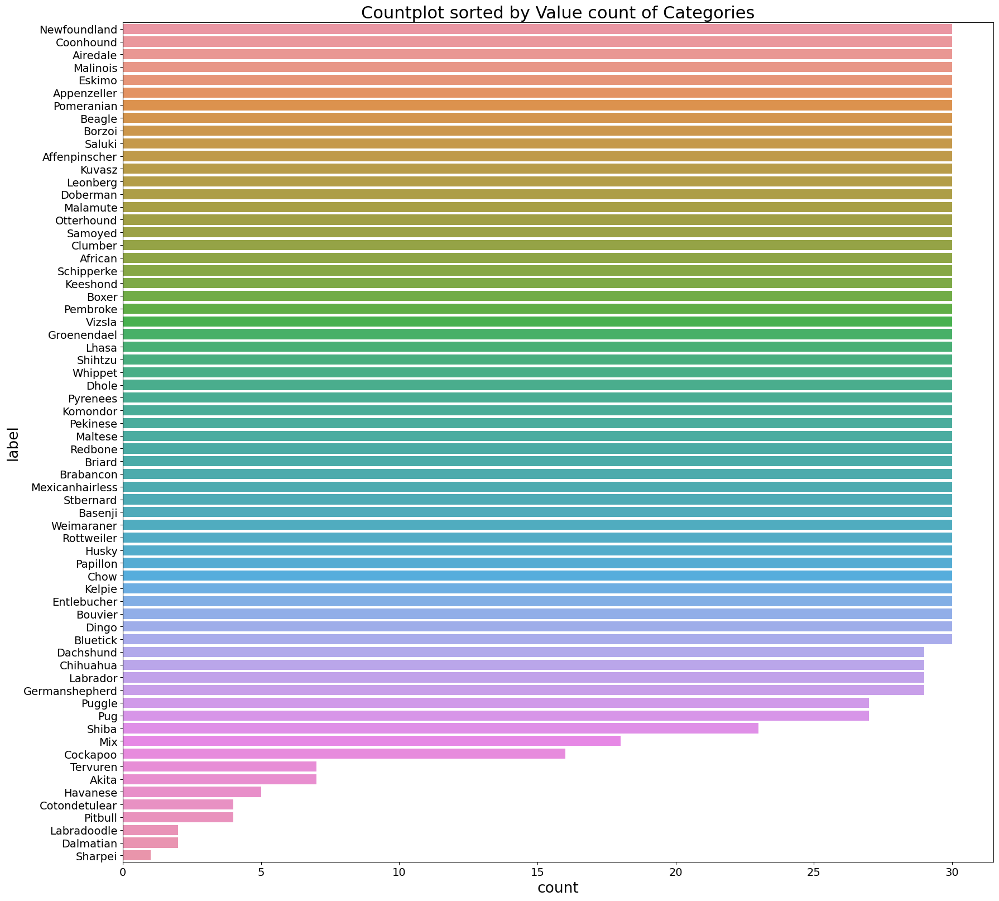

In [17]:
plt.figure(figsize=(18, rows))
ax = sns.countplot(y="label", data=train_df2, order=train_df2["label"].value_counts().index)
plt.title("Countplot sorted by Value count of Categories")
plt.tight_layout()
plt.show()

### 2.2.2 Countplot Sorted by Alphebetical Order of Category Names

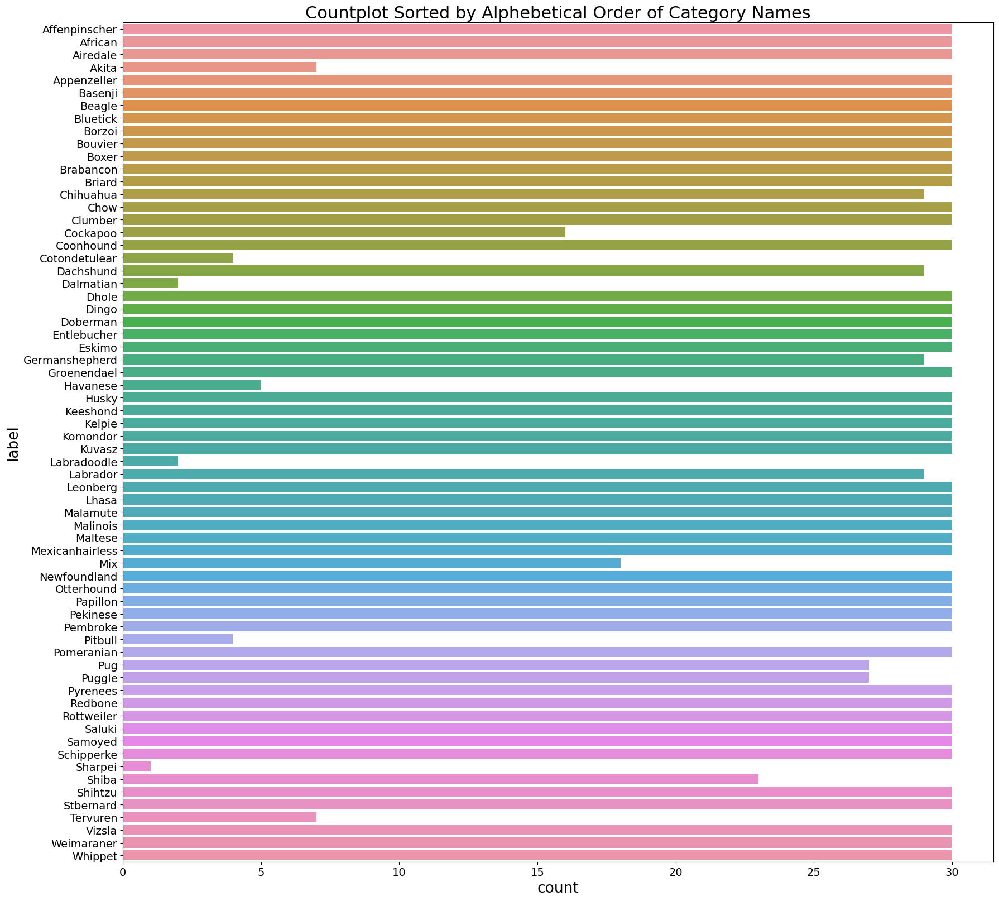

In [18]:
plt.figure(figsize=(18, rows))
ax = sns.countplot(y="label", data=train_df2, order=classes2)
plt.title("Countplot Sorted by Alphebetical Order of Category Names")
plt.tight_layout()
plt.show()

# 3. Preprocessing Function

- In the preprocessing step, every image was resized to the target dimensions of (299, 299), and the pixel values were rescaled to a range of 0 to 1. These dimensions, (299, 299), correspond to the input shape required by the pretrained model "InceptionV3."
- The target class was categorized, and both the training and validation image sets were randomized for variability. Furthermore, certain images underwent random horizontal and vertical flips, while adjustments in sheerness and rotation were applied to enhance dataset diversity. Additionally, a segment of the training dataset was reserved for use as the validation set.

In [50]:
def get_data(batch_size=32, target_size=(299, 299), class_mode="categorical", training_dir=training_dir, testing_dir=testing_dir, x_col="id", y_col="label"):
    print("Preprocessing and Generating Data Batches.......\n")

    rescale = 1.0/255

    train_batch_size = batch_size
    validation_batch_size = batch_size*5
    test_batch_size = batch_size*5

    train_shuffle = True
    val_shuffle = True
    test_shuffle = False

    train_datagen = ImageDataGenerator(
        horizontal_flip=True,
#         vertical_flip=True,
        rotation_range=45,
        shear_range=15,
        rescale=rescale,
        validation_split=0.25)

    train_generator = train_datagen.flow_from_dataframe(
        train_df,
        training_dir,
        x_col=x_col,
        y_col=y_col,
        target_size=target_size,
        classes=classes,
        class_mode=class_mode,
        batch_size=batch_size,
        shuffle=True,
        seed=42,
        subset='training')


    validation_generator = train_datagen.flow_from_dataframe(
        train_df,
        training_dir,
        x_col=x_col,
        y_col=y_col,
        classes=classes,
        target_size=target_size,
        class_mode=class_mode,
        batch_size=validation_batch_size,
        shuffle=True,
        seed=42,
        subset='validation')

    test_datagen = ImageDataGenerator(rescale=rescale)

    test_generator = test_datagen.flow_from_dataframe(
        test_df,
        testing_dir,
        x_col=x_col,
        y_col=y_col,
        # classes=classes,
        target_size=target_size,
        class_mode=class_mode,
        batch_size=test_batch_size,
        shuffle=False,
        seed=42)

#     y = [val for sublist in train_generator.classes for val in sublist]
    class_weights = get_weight(train_generator.classes, binary=False)

    steps_per_epoch = len(train_generator)
    validation_steps = len(validation_generator)

    print("\nPreprocessing and Data Batch Generation Completed.\n")


    return train_generator, validation_generator, test_generator, class_weights, steps_per_epoch, validation_steps

from sklearn.utils.class_weight import compute_class_weight
# Calculate Class Weights
def get_weight(y, binary=True, n_samples=-1):
    print(y)
    if binary==False:
        unique_classes = np.unique(y)
        class_weights = compute_class_weight(class_weight = 'balanced', classes = np.unique(y), y = y)
        # class_weights = {l:c for l,c in zip(np.unique(classes[i]), class_weights)}
        # class_weights = {class_value: weight for class_value, weight in zip(unique_classes, class_weights)}
        # class_weight_mapping = {class_idx: class_weights[class_idx] for class_idx, weight in enumerate(class_weights)}
        # print(class_weight_mapping)
    else:
        d = {x:y.count(x) for x in set(y)}
        num_class_temp = 2
        class_weights = {}

        for cls in d:
            count = d.get(cls)
            class_weight = n_samples / (num_class_temp * count)
            class_weights[cls] = class_weight
#             temp = np.concatenate((np.repeat(0, n_samples-count), np.repeat(1, count)))
#             class_weight =  cw.compute_class_weight('balanced', np.unique(temp), temp)
#             class_weights[cls] = class_weight
    return class_weights


# 4. Model Function

## 4.1 Pretrained Model

The get_model function is a versatile utility for creating and configuring pre-trained CNN models with customization options for various computer vision tasks.

In [46]:
def get_model(model_name, input_shape=(96, 96, 3), num_class=2, weights='imagenet', dense_units=1024):
    inputs = Input(input_shape)

    # if model_name == "Xception":
    #     base_model = Xception(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet50":
    #     base_model = ResNet50(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet101":
    #     base_model = keras.applications.resnet.ResNet101(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet152":
    #     base_model = keras.applications.resnet.ResNet152(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet50V2":
    #     base_model = resnet_v2.ResNet50V2(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet101V2":
    #     base_model = resnet_v2.ResNet101V2(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNet152V2":
    #     base_model = resnet_v2.ResNet152V2(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNeXt50":
    #     base_model = resnext.ResNeXt50(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "ResNeXt101":
    #     base_model = resnext.ResNeXt101(include_top=False, weights=weights, input_shape=input_shape)
    if model_name == "InceptionV3":
        base_model = InceptionV3(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "InceptionResNetV2":
    #     base_model = InceptionResNetV2(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "DenseNet201":
    #     base_model = DenseNet201(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "NASNetMobile":
    #     base_model = NASNetMobile(include_top=False, weights=weights, input_shape=input_shape)
    # elif model_name == "NASNetLarge":
    #     base_model = NASNetLarge(include_top=False, weights=weights, input_shape=input_shape)


    x = base_model(inputs)
    x = Dropout(0.8)(x)
    x = GlobalAveragePooling2D()(x)
#     x = Dropout(0.5)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.8)(x)


    if num_class>1:
        outputs = Dense(num_class, activation="softmax")(x)
    else:
        outputs = Dense(1, activation="sigmoid")(x)

#     model = Model(inputs=base_model.input, outputs=outputs)
    model = Model(inputs=inputs, outputs=outputs)

    model.summary()


    return model

## 4.2 Model Build from Scratch

This function defines a convolutional neural network (CNN) model for image classification tasks with batch normalization, dropout, and regularization, suitable for binary or multi-class classification.

In [21]:
def get_conv_model(num_class=2, input_shape=(150,150, 3)):
    model = Sequential()

    model.add(Conv2D(32, (3, 3), input_shape=(32, 32, 3), padding='same', use_bias=False, kernel_regularizer=l2(1e-4)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Conv2D(32, (3, 3), padding='same', use_bias=False, kernel_regularizer=l2(1e-4)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPool2D())
    model.add(Dropout(0.2))

    model.add(Conv2D(64, (3, 3), padding='same', use_bias=False, kernel_regularizer=l2(1e-4)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Conv2D(64, (3, 3), padding='same', use_bias=False, kernel_regularizer=l2(1e-4)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPool2D())
    model.add(Dropout(0.2))

    model.add(GlobalAveragePooling2D())

    model.add(Dense(num_class, activation='softmax'))
    # if num_class>1:
    #     model.add(Dense(num_class, activation='softmax'))
    # else:
    #     model.add(Dense(num_class, activation='sigmoid'))

    print(model.summary())

    return model

# 5. Call Back Configuration

This code section configures training callbacks for a neural network, featuring a learning rate scheduler, model checkpointing, and early stopping based on validation metrics.

In [22]:
print("Settting Callbacks")

def step_decay(epoch, lr):
    # initial_lrate = 1.0 # no longer needed
    lrate = lr
    if epoch==2:
        lrate = 0.0001
#     lrate = lr * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate


checkpoint = ModelCheckpoint(
    model_file,
    monitor='val_acc',
    save_best_only=True)


early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    verbose=1,
    restore_best_weights=True)


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=1,
    min_lr=0.0000001,
    verbose=1)


learning_rate_scheduler = LearningRateScheduler(step_decay, verbose=1)
# f1_metrics = Metrics()



callbacks = [reduce_lr, early_stopping]
# callbacks = [checkpoint, reduce_lr, early_stopping]
# callbacks = [reduce_lr, early_stopping, f1_metrics]


print("Set Callbacks at ", date_time(1))

Settting Callbacks
Set Callbacks at  Timestamp: 2023-09-05 17:39:09


# 6. Load Model

## 6.1 Model Configuration

In [23]:
# dim = 96
# dim = 224
dim = 299

input_shape = (dim, dim, 3)

num_class = len(classes)

weights = 'imagenet'
dense_units = 256

## 6.2 Load Model with Configuration

In [47]:
print("Getting Base Model", date_time(1))

model = get_model(model_name="InceptionV3", input_shape=input_shape, num_class=num_class, weights=weights, dense_units=dense_units)
# model = get_conv_model(num_class=num_class, input_shape=input_shape)
print("Loaded Base Model", date_time(1))

Getting Base Model Timestamp: 2023-09-05 18:05:09
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 dropout_6 (Dropout)         (None, 8, 8, 2048)        0         
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 batch_normalization_288 (Ba  (None, 2048)             8192      
 tchNormalization)                                               
                                                                 
 dropout_

# 7. Get Data

## 7.1 Data Configuration

In [48]:
batch_size = 64

class_mode = "categorical"
# class_mode = "binary"

target_size = (dim, dim)
y_col = "label"
target_size

(299, 299)

## 7.2 Get Data

In [51]:
train_generator, validation_generator, test_generator, class_weights, steps_per_epoch, validation_steps = get_data(batch_size=batch_size,
                                                                                                                   target_size=target_size,
                                                                                                                   class_mode=class_mode,
                                                                                                                   y_col=y_col)

Preprocessing and Generating Data Batches.......

Found 1297 validated image filenames belonging to 66 classes.
Found 432 validated image filenames belonging to 66 classes.
Found 1733 validated image filenames belonging to 1 classes.
[42, 45, 35, 53, 59, 29, 36, 10, 37, 61, 64, 26, 32, 19, 21, 52, 6, 65, 27, 11, 7, 37, 37, 11, 56, 5, 31, 42, 40, 60, 33, 55, 31, 1, 42, 55, 2, 55, 60, 38, 55, 17, 34, 50, 11, 25, 57, 36, 2, 5, 59, 1, 7, 45, 60, 37, 53, 40, 55, 9, 17, 8, 61, 26, 61, 40, 12, 17, 61, 64, 0, 61, 37, 15, 5, 12, 39, 24, 7, 10, 29, 52, 0, 6, 11, 59, 29, 53, 38, 51, 10, 24, 51, 29, 8, 16, 2, 32, 64, 33, 25, 31, 60, 43, 59, 60, 1, 52, 32, 22, 41, 61, 43, 31, 38, 65, 50, 8, 15, 6, 19, 7, 25, 38, 8, 11, 16, 21, 64, 59, 5, 12, 54, 46, 50, 2, 23, 2, 6, 37, 30, 32, 17, 10, 10, 39, 63, 35, 21, 46, 53, 47, 63, 41, 60, 22, 13, 16, 45, 42, 43, 35, 30, 36, 49, 6, 37, 21, 64, 63, 7, 10, 38, 57, 49, 13, 14, 6, 48, 33, 40, 13, 43, 29, 30, 52, 3, 60, 11, 44, 46, 41, 38, 47, 31, 39, 9, 50, 56, 5

In [52]:
len(class_weights)

66

# 8. Model Compilation

In [53]:
print("Compliling Model ...")


learning_rate = 0.0001
optimizer = Adam(learning_rate)
# optimizer = Adam()


loss = 'categorical_crossentropy'
# loss = 'binary_crossentropy'
metrics = ['accuracy']
# metrics = [auroc]


model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

print("Completed Model Compilation.\n")

Compliling Model ...
Completed Model Compilation.



# 9. Training Model

The model underwent 50 training epochs on the entire training dataset, with the inclusion of adjusted class weights. It employed the Adam optimizer with a learning rate set to 0.0001, calculated loss using "Categorical Crossentropy," and evaluated its performance using the "Accuracy" metric on the validation dataset.

## 9.1 Training Configuration

In [55]:
steps_per_epoch = len(train_generator)
validation_steps = len(validation_generator)

verbose = 1
epochs = 30
validation_steps

2

In [ ]:
# batch_size = 32
# train_generator, validation_generator, test_generator, class_weights, steps_per_epoch, validation_steps = get_data(batch_size=batch_size)

In [56]:
print("Starting Trainning ...\n")

start_time = time.time()
print(date_time(1))


print("Trainning Model ...\n")


history = model.fit_generator(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    verbose=verbose,
    callbacks=callbacks,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    class_weight=dict(enumerate(class_weights)))



elapsed_time = time.time() - start_time
elapsed_time = time.strftime("%H:%M:%S", time.gmtime(elapsed_time))


print("\nElapsed Time: " + elapsed_time)
print("Completed Model Trainning", date_time(1))

Starting Trainning ...

Timestamp: 2023-09-05 18:06:44
Trainning Model ...



<ipython-input-56-a4c244759011>:10: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/30
21/21 [==============================] - 67s 3s/step - loss: 7.0979 - accuracy: 0.0301 - val_loss: 3.6133 - val_accuracy: 0.1644 - lr: 1.0000e-04
Epoch 2/30
21/21 [==============================] - 59s 3s/step - loss: 5.3835 - accuracy: 0.1095 - val_loss: 2.9514 - val_accuracy: 0.4769 - lr: 1.0000e-04
Epoch 3/30
21/21 [==============================] - 57s 3s/step - loss: 4.1018 - accuracy: 0.2174 - val_loss: 2.2812 - val_accuracy: 0.6042 - lr: 1.0000e-04
Epoch 4/30
21/21 [==============================] - 60s 3s/step - loss: 3.2128 - accuracy: 0.3470 - val_loss: 1.7594 - val_accuracy: 0.6574 - lr: 1.0000e-04
Epoch 5/30
21/21 [==============================] - 51s 2s/step - loss: 2.4277 - accuracy: 0.4348 - val_loss: 1.3696 - val_accuracy: 0.6736 - lr: 1.0000e-04
Epoch 6/30
21/21 [==============================] - 50s 2s/step - loss: 2.1224 - accuracy: 0.5212 - val_loss: 1.1995 - val_accuracy: 0.7037 - lr: 1.0000e-04
Epoch 7/30
21/21 [==============================] - 59s 3s

# 10. Model Performance Visualization

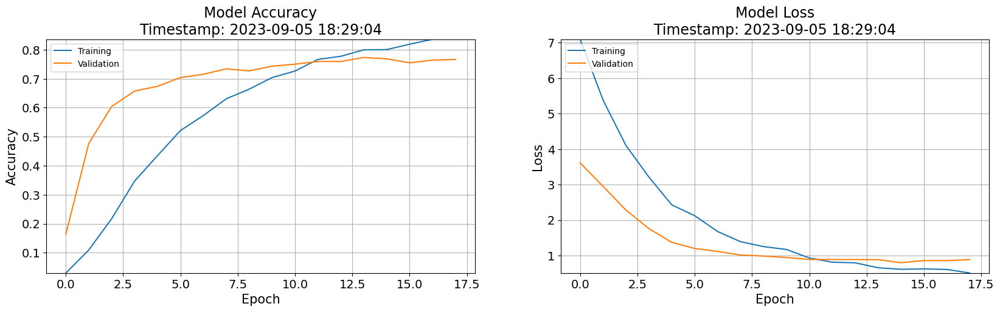

In [59]:
def plot_performance(history=None, figure_directory=None):
    xlabel = 'Epoch'
    legends = ['Training', 'Validation']

#     ylim_pad = [0.005, 0.005]
    ylim_pad = [0, 0]


    plt.figure(figsize=(20, 5))

    # Plot training & validation Accuracy values

    y1 = history.history['accuracy']
    y2 = history.history['val_accuracy']

    min_y = min(min(y1), min(y2))-ylim_pad[0]
    max_y = max(max(y1), max(y2))+ylim_pad[0]

#     min_y = .96
#     max_y = 1


    plt.subplot(121)

    plt.plot(y1)
    plt.plot(y2)

    plt.title('Model Accuracy\n'+date_time(1), fontsize=17)
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.ylim(min_y, max_y)
    plt.legend(legends, loc='upper left')
    plt.grid()


    # Plot training & validation loss values

    y1 = history.history['loss']
    y2 = history.history['val_loss']

    min_y = min(min(y1), min(y2))-ylim_pad[1]
    max_y = max(max(y1), max(y2))+ylim_pad[1]

#     min_y = .1
#     max_y = 0

    plt.subplot(122)

    plt.plot(y1)
    plt.plot(y2)

    plt.title('Model Loss\n'+date_time(1), fontsize=17)
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    plt.ylim(min_y, max_y)
    plt.legend(legends, loc='upper left')
    plt.grid()
    if figure_directory:
        plt.savefig(figure_directory+"/history")

    plt.show()

plot_performance(history=history)

# 11. Model Evaluation

In [60]:
model.evaluate_generator(generator=validation_generator, steps=len(validation_generator), verbose=1)

<ipython-input-60-a01eae2c87ce>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  model.evaluate_generator(generator=validation_generator, steps=len(validation_generator), verbose=1)


2/2 [==============================] - 11s 2s/step - loss: 0.8237 - accuracy: 0.7755


[0.8237386345863342, 0.7754629850387573]

- Loss:0.8237
- Accuracy: 0.7754

# 12. Prediction and Inference

In [61]:
label_map = (train_generator.class_indices)
label_map_inv = {v: k for k, v in label_map.items()}

In [62]:
ypreds = model.predict_generator(generator=test_generator, steps = len(test_generator),  verbose=1)

<ipython-input-62-1df1fd24ce3c>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  ypreds = model.predict_generator(generator=test_generator, steps = len(test_generator),  verbose=1)


6/6 [==============================] - 13s 2s/step


In [63]:
ypred = ypreds.argmax(axis=-1)

# 13. Inference Performance Visualization

In [64]:
def get_rand_test_img(test_generator=None, labels_test=None, count=5):

    filepaths = test_generator.filepaths
    file_names = test_generator.filenames

    selected_filepaths = []
    selected_file_names = []
    selected_labels = []

    mem = set()

    i = count

    num_test_sample = test_generator.n

    for file in test_generator.labels:
        if i<=0:
            break

        rnd = random.randint(0, test_generator.n)
        while rnd in mem:
            rnd = random.randint(0, test_generator.n)

        selected_filepaths.append(filepaths[rnd])
        selected_file_names.append(file_names[rnd])

        lbl = label_map_inv[labels_test[rnd]]
        lbl = re.sub("_", " ", lbl)
        lbl = lbl.title()

        selected_labels.append(lbl)

        i-=1

    return selected_file_names, selected_file_names, selected_labels

In [65]:
test_img_count = 10
labels_test = ypred
selected_file_names, selected_file_names, selected_labels = get_rand_test_img(test_generator=test_generator, labels_test=labels_test, count=test_img_count)

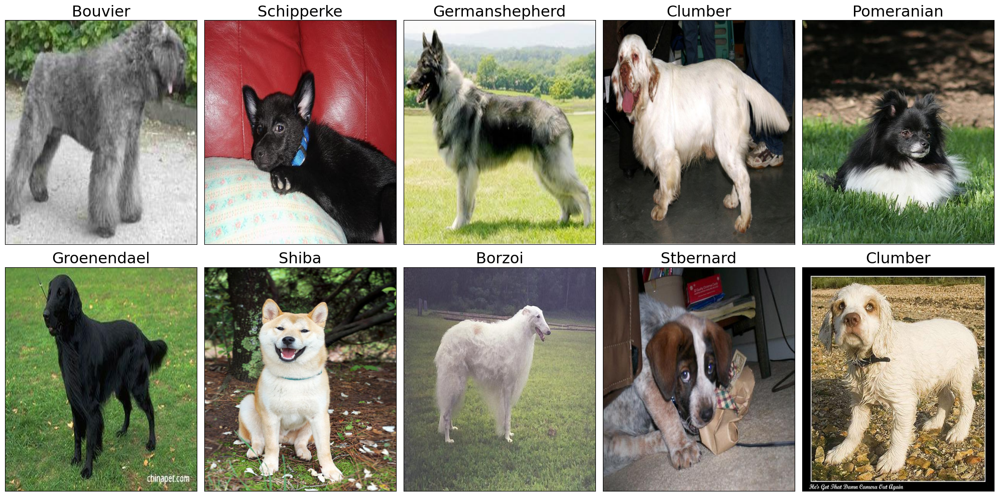

In [66]:
# Display predict images
count = test_img_count

ncols = 5
nrows = count//ncols if count%ncols==0 else count//ncols+1

figsize=(20, ncols*nrows)

ticksize = 14
titlesize = ticksize + 8
labelsize = ticksize + 5


params = {'figure.figsize' : figsize,
          'axes.labelsize' : labelsize,
          'axes.titlesize' : titlesize,
          'xtick.labelsize': ticksize,
          'ytick.labelsize': ticksize}

plt.rcParams.update(params)


i = 0

for i in range(0, count):
    if i>test_img_count:
        break
    plt.subplot(nrows, 5, i+1)
    plot_image(selected_file_names[i], testing_dir, aspect='auto')
    plt.title(selected_labels[i])

plt.tight_layout()
plt.show()

# 14. Conclustion

The current solution has an accuracy of 77.54%, which is a good start. However, there is still room for improvement. One way to improve the accuracy is to scale the dataset. This means increasing the number of images for each breed. A larger dataset will provide the model with more data to learn from, which can lead to better accuracy.

Another way to improve the accuracy is to use a different deep learning architecture. The Inception_V3 architecture is a good starting point, but there are other architectures that may be more effective for dog breed classification. For example, the ResNet architecture has been shown to achieve high accuracy on a variety of image classification tasks.

It is important to fine-tune the model parameters. This means adjusting the hyperparameters of the model, such as the learning rate and the number of epochs. Fine-tuning can help the model to learn the features of dog breeds more accurately.

Some additional factor when scaling the dataset of dog breeds:

- The quality of the images: The images should be high-quality and well-labeled.
- The diversity of the images: The dataset should include a variety of images of each breed, from different angles and lighting conditions.
- The distribution of the images: The images should be evenly distributed across the different breeds.

👉 By scaling the dataset, using a different better deep learning architecture, and fine-tuning the model parameters, it is possible to achieve an accuracy of 90% or higher. This would make the model a reliable tool for dog breed classification.

Benefit of dog breed classification tool:
- Helping to prevent dog theft. Dog thieves often target specific breeds, such as purebreds or puppies. A dog breed detection tool can help to identify stolen dogs and return them to their owners.
- Identifying dogs that are at risk of being abandoned or neglected. Some dog breeds are more likely to be abandoned or neglected than others. A dog breed detection tool can help to identify these dogs and provide them with the care they need.
- Educating people about dog breeds. A dog breed detection tool can help people to learn more about different dog breeds and their unique characteristics. This can help people to make informed decisions about choosing a dog.